# Week 4 Notebook
Source for University data: https://nces.ed.gov/ipeds/use-the-data/survey-components
Key for data file: https://nces.ed.gov/programs/edge/Geographic/SchoolLocations
Key for data types: https://www.google.com/url?client=internal-element-cse&cx=011774183035190766908:u7ygjkz8dry&q=https://nces.ed.gov/programs/edge/docs/EDGE_GEOCODE_POSTSEC_1617.pdf&sa=U&ved=2ahUKEwiaiLyfwYbqAhUSbq0KHeUyDhAQFjAAegQIAhAB&usg=AOvVaw3Bf6JohA_PCo7m4fWhY918

In [1]:
import pandas as pd
from urllib.request import urlopen
from geopy.geocoders import Nominatim
import requests
from pandas.io.json import json_normalize
import folium
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors

#Hyperparameters
RADIUS = 1500
VENUE_LIMIT = 30
NUM_TOP_VENUES_TO_CONSIDER = 10
KCLUSTERS = 5

#pd.options.display.max_rows = 2000

### Read in CSV of U.S. secondary schools

In [2]:
df_usschools_original = pd.read_csv('US University Geocode.csv')
df_usschools = df_usschools_original[['NAME','CITY','STATE','LAT','LON',]]
df_usschools

,NAME,CITY,STATE,LAT,LON
0,Alabama A & M University,Normal,AL,34.783368,-86.568502
1,University of Alabama at Birmingham,Birmingham,AL,33.505697,-86.799345
2,Amridge University,Montgomery,AL,32.362609,-86.174010
3,University of Alabama in Huntsville,Huntsville,AL,34.724557,-86.640449
4,Alabama State University,Montgomery,AL,32.364317,-86.295677
...,...,...,...,...,...
7063,Baker College - Flint,Flint,MI,42.975177,-83.697246
7064,WellSpring School of Allied Health-Wichita,Wichita,KS,37.673562,-97.442623
7065,Access Careers-Islandia,Islandia,NY,40.800874,-73.175617
7066,Franciscan School of Theology - San Diego,San Diego,CA,32.772407,-117.191964


### Display map of all U.S. Secondary Schools

In [3]:
#highlight whole cell then Ctrl + '/'' to comment or uncommment whole cell
latitude = 37.0902
longitude = -95.7129
map_usuniversities = folium.Map(location=[latitude, longitude], zoom_start=3,max_bounds=True,prefer_canvas=True, min_zoom=2)

# markers_colors = []
# for lat, lon, university in zip(df_usschools['LAT'], df_usschools['LON'], df_usschools['NAME']):
#     label = folium.Popup(str(university), parse_html=True)
#     folium.Circle(
#         [lat, lon],
#         radius=5,
#         popup=label,
#         fill=True,
#         fill_opacity=0.7).add_to(map_usuniversities)
markers_colors = []
for lat, lon, university in zip(df_usschools['LAT'], df_usschools['LON'], df_usschools['NAME']):
    label = folium.Popup(str(university), parse_html=True)
    folium.Circle(
        [lat, lon],
        popup=label).add_to(map_usuniversities)
map_usuniversities

### Downsize data to just midwest of interest

In [17]:
df_midwest = df_usschools[df_usschools['STATE'].str.contains("MI") | df_usschools['STATE'].str.contains("OH")]
#df_midwest = df_usschools[df_usschools['STATE'].str.contains("IN")]

#added in drop - may change results and need to verify
df_midwest.reset_index(drop=True)
#df_midwest.reset_index()

,NAME,CITY,STATE,LAT,LON
0,Moody Theological Seminary and Graduate School...,Plymouth,MI,42.366828,-83.451903
1,West Michigan College of Barbering and Beauty,Kalamazoo,MI,42.259329,-85.590244
2,Adrian College,Adrian,MI,41.898591,-84.061481
3,Albion College,Albion,MI,42.245049,-84.745639
4,Hillsdale Beauty College,Hillsdale,MI,41.918718,-84.631429
...,...,...,...,...,...
506,Valley College-Cleveland,Cleveland,OH,41.419409,-81.747723
507,Hillsdale Beauty College,Coldwater,MI,41.954579,-84.998985
508,Dayton School of Medical Massage - Columbus Sc...,Dublin,OH,40.089637,-83.125427
509,Davenport University - Detroit,Detroit,MI,42.370215,-83.076227


In [18]:
sb_lat = 41.6764
sb_lon = -86.2520
map_midwestuniversities = folium.Map(location=[sb_lat, sb_lon], zoom_start=6,max_bounds=True,prefer_canvas=True, min_zoom=2)

markers_colors = []
for sb_lat, sb_lon, university in zip(df_midwest['LAT'], df_midwest['LON'], df_midwest['NAME']):
    label = folium.Popup(str(university), parse_html=True)
    folium.Circle(
        [sb_lat, sb_lon],
        radius=5,
        popup=label).add_to(map_midwestuniversities)
    
map_midwestuniversities.save('map_midwestuniversities.html')
map_midwestuniversities

### Define foursquare credentials

In [21]:
CLIENT_ID = 'AJJHZCAKBBVZY333EVXDYLDO3ZXKVRDJHVJ3MOYFUSRTO1BZ' # your Foursquare ID
CLIENT_SECRET = 'PENS13MAMVLSKPHOOCA1E5I0RALVGVOESKDEQU3U05YEEIQZ' # your Foursquare Secret
VERSION = '20180604'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

def getNearbyVenues(names, latitudes, longitudes):
    LIMIT = VENUE_LIMIT
    radius = RADIUS
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
        
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lng, 
    RADIUS, 
    LIMIT)
        # make the GET request
        try:
            results = requests.get(url, verify=False).json()["response"]['groups'][0]['items']
             # return only relevant information for each nearby venue
            venues_list.append([(
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])

            nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venues.columns = ['School', 
                  'School Latitude', 
                  'School Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
            print("Success ",name, "Lat ",lat, "Long ",lng)
        except:
            print("Bad Result for ",name, "Lat ",lat, "Long ",lng)
       
    
    return(nearby_venues)

Your credentails:
CLIENT_ID: AJJHZCAKBBVZY333EVXDYLDO3ZXKVRDJHVJ3MOYFUSRTO1BZ
CLIENT_SECRET:PENS13MAMVLSKPHOOCA1E5I0RALVGVOESKDEQU3U05YEEIQZ


### Split all of the US Universities into smaller buckets to pull from Four Square

In [9]:
# lst_usstates = df_usschools.STATE.unique()
# #Loop through each state

# for tempstate in lst_usstates:
#     df_temp = df_usschools[df_usschools['STATE'] == tempstate]
#     print('Pulling data for the state of:', tempstate)
#     df_temp_venues = getNearbyVenues(names=df_temp['NAME'],
#                                    latitudes=df_temp['LAT'],
#                                    longitudes=df_temp['LON']
#                                   )   
#     df_temp_venues.to_csv('venues.csv', mode='a', header=false)
    
 


Pulling data for the state of: AL
Alabama A & M University
Bad Result for  Alabama A & M University Lat  34.783367999999996 Long  -86.568502
University of Alabama at Birmingham
Bad Result for  University of Alabama at Birmingham Lat  33.505697 Long  -86.799345
Amridge University
Bad Result for  Amridge University Lat  32.362609 Long  -86.17401
University of Alabama in Huntsville
Bad Result for  University of Alabama in Huntsville Lat  34.724557 Long  -86.640449
Alabama State University
Bad Result for  Alabama State University Lat  32.364317 Long  -86.295677
University of Alabama System Office
Bad Result for  University of Alabama System Office Lat  33.207015000000006 Long  -87.52959399999999
The University of Alabama
Bad Result for  The University of Alabama Lat  33.211875 Long  -87.545978
Central Alabama Community College
Bad Result for  Central Alabama Community College Lat  32.92478 Long  -85.945266
Athens State University
Bad Result for  Athens State University Lat  34.806793 Long 

UnboundLocalError: local variable 'nearby_venues' referenced before assignment

In [ ]:
#One hot encoding for temp dataframe
# TEMP_onehot = pd.get_dummies(df_temp_venues[['Venue Category']],prefix="",prefix_sep="")
# TEMP_onehot['School']=df_temp_venues['School']
# fixed_columns = [TEMP_onehot.columns[-1]] + list(TEMP_onehot.columns[:-1])
# TEMP_onehot = TEMP_onehot[fixed_columns]

# TEMP_univ_venues_grouped = TEMP_onehot.groupby('School').mean().reset_index(drop=True)
# TEMP_univ_venues_grouped

In [22]:
import warnings
warnings.filterwarnings('ignore')

df_IN_venues = getNearbyVenues(names=df_midwest['NAME'],
                                   latitudes=df_midwest['LAT'],
                                   longitudes=df_midwest['LON']
                                  )


Success  Moody Theological Seminary and Graduate School--Michigan Lat  42.366828000000005 Long  -83.451903
Success  West Michigan College of Barbering and Beauty Lat  42.259329 Long  -85.590244
Success  Adrian College Lat  41.898590999999996 Long  -84.061481
Success  Albion College Lat  42.245049 Long  -84.745639
Success  Hillsdale Beauty College Lat  41.918718 Long  -84.631429
Success  Hillsdale Beauty College Lat  41.954578999999995 Long  -84.998985
Success  Northwestern Technological Institute Lat  42.469188 Long  -83.238529
Success  Alma College Lat  43.38004 Long  -84.672053
Success  Alpena Community College Lat  45.081647 Long  -83.44506899999999
Success  Andrews University Lat  41.963859 Long  -86.355815
Success  Aquinas College Lat  42.960190000000004 Long  -85.628785
Success  Baker College Lat  42.984804 Long  -84.172404
Success  Baker College of Owosso Lat  42.985547 Long  -84.171879
Success  Baker College of Allen Park Lat  42.274264 Long  -83.20348100000001
Success  Baker C

Success  Saginaw Valley State University Lat  43.511759999999995 Long  -83.96427299999999
Success  Schoolcraft College Lat  42.419278999999996 Long  -83.43095799999999
Success  Siena Heights University Lat  41.905623999999996 Long  -84.01884100000001
Success  St Clair County Community College Lat  42.979494 Long  -82.428717
Success  Southwestern Michigan College Lat  41.965095 Long  -86.08271500000001
Success  Specs Howard School of Media Arts Lat  42.459245 Long  -83.23930899999999
Success  Spring Arbor University Lat  42.206568 Long  -84.556074
Success  Michigan Career and Technical Institute Lat  42.504599 Long  -85.517049
Success  Finlandia University Lat  47.127868 Long  -88.588756
Success  Western Michigan University-Thomas M. Cooley Law School Lat  42.731 Long  -84.554429
Success  Twin City Beauty College Lat  42.071099 Long  -86.47655
Success  Walsh College Lat  42.573888000000004 Long  -83.14719699999999
Success  Washtenaw Community College Lat  42.26361 Long  -83.665590000000

Success  Kent State University at Geauga Lat  41.483727 Long  -81.143085
Success  Kenyon College Lat  40.374408 Long  -82.397977
Success  Kettering College Lat  39.695052000000004 Long  -84.192006
Success  Kettering College - Ollie Davis Medical Arts and Education Center Lat  39.693918 Long  -84.08404399999999
Success  Lake Erie College Lat  41.717841 Long  -81.251817
Success  Lakeland Community College Lat  41.637463000000004 Long  -81.364723
Success  O C Collins Career Center Lat  38.491898 Long  -82.473516
Success  James A Rhodes State College Lat  40.738347 Long  -84.026319
Success  Ohio Business College-Sheffield Lat  41.423809000000006 Long  -82.073403
Success  Ohio Business College-Sandusky Lat  41.415212 Long  -82.667389
Success  Lorain County Community College Lat  41.413292999999996 Long  -82.073549
Success  Lourdes University Lat  41.710009 Long  -83.706108
Success  Malone University Lat  40.825662 Long  -81.376863
Success  Marietta College Lat  39.41668 Long  -81.4500449999

Success  Moler-Pickens Beauty Academy Lat  39.317488 Long  -84.499701
Success  Douglas J Aveda Institute Lat  42.734606 Long  -84.480467
Success  Ross Medical Education Center-Brighton Lat  42.548468 Long  -83.796918
Success  Ross Medical Education Center-Ann Arbor Lat  42.25294 Long  -83.666667
Success  Taylortown School of Beauty Inc Lat  42.254745 Long  -83.259322
Success  Ross Medical Education Center-Port Huron Lat  43.024632000000004 Long  -82.452984
Success  Raphael's School of Beauty Culture Inc-Alliance Lat  40.902642 Long  -81.152086
Success  Raphael's School of Beauty Culture Inc-Brunswick Lat  41.240245 Long  -81.80614200000001
Success  Portage Lakes Career Center Lat  40.943121999999995 Long  -81.472008
Success  Greene County Vocational School District Lat  39.771037 Long  -83.946816
Success  Ross Medical Education Center-Roosevelt Park Lat  43.191474 Long  -86.267098
Success  Ross Medical Education Center-Kentwood Lat  42.880955 Long  -85.605379
Success  Ross Medical Educ

Success  Paul Mitchell the School-Cincinnati Lat  39.291618 Long  -84.392501
Success  Dorsey School of Business-Roseville Culinary Academy Lat  42.527764000000005 Long  -82.915541
Success  Paul Mitchell the School-Cleveland Lat  41.330927 Long  -81.463033
Success  Paul Mitchell the School-Columbus Lat  40.059575 Long  -82.938765
Success  Ross Medical Education Center-Battle Creek Lat  42.247801 Long  -85.20031
Success  Herzing University-Toledo Lat  41.639266 Long  -83.665453
Success  L'esprit Academy Lat  42.321903999999996 Long  -83.457386
Success  L'esprit Academy - Royal Oak Lat  42.486238 Long  -83.146334
Success  Marketti Academy of Cosmetology Lat  42.683352 Long  -83.37473299999999
Success  Four County Career Center Lat  41.452808000000005 Long  -84.303115
Success  Elevate Salon Institute Lat  41.375544 Long  -81.791333
Success  Summit Salon Academy-Perrysburg Lat  41.54424 Long  -83.620281
Success  Dorsey School of Business-Waterford Pontiac Lat  42.643595 Long  -83.3246310000

In [24]:
df_IN_venues
df_IN_venues.to_csv('venues.csv', mode='a', header=False)

### Onehot encoding of School with venues
The output will be used in the K-Means model

In [141]:
IN_onehot = pd.get_dummies(df_IN_venues[['Venue Category']],prefix="",prefix_sep="")
IN_onehot['School']=df_IN_venues['School']
fixed_columns = [IN_onehot.columns[-1]] + list(IN_onehot.columns[:-1])
IN_onehot = IN_onehot[fixed_columns]

IN_univ_venues_grouped = IN_onehot.groupby('School').mean().reset_index()
IN_univ_venues_grouped

,School,Zoo Exhibit,ATM,Accessories Store,Adult Boutique,Advertising Agency,African Restaurant,Airport,Airport Terminal,American Restaurant,...,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo
0,Adler University,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Alexandria School of Scientific Therapeutics,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Ambria College of Nursing,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,0.000000
3,American Academy of Art,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,American College of Education,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,...,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,American Islamic College,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,...,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000
6,Anabaptist Mennonite Biblical Seminary,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Ancilla College,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,Anderson University,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,Augustana College,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### Display most frequent venue by mean

In [142]:
#Print each neighborhood along with top 5 most common venues
num_top_venues = 10

for hood in IN_univ_venues_grouped['School']:
    print("----"+hood+"----")
    temp = IN_univ_venues_grouped[IN_univ_venues_grouped['School'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Adler University----
                       venue  freq
0                    Theater  0.17
1                      Hotel  0.17
2                  Gastropub  0.07
3                Coffee Shop  0.07
4                Salad Place  0.07
5  Middle Eastern Restaurant  0.07
6                   Fountain  0.03
7                       Park  0.03
8          Outdoor Sculpture  0.03
9   Mediterranean Restaurant  0.03


----Alexandria School of Scientific Therapeutics----
            venue  freq
0     Music Store  0.09
1     Pizza Place  0.09
2            Bank  0.09
3   Grocery Store  0.09
4     Golf Course  0.09
5  Discount Store  0.09
6        Pharmacy  0.09
7           Diner  0.09
8             Bar  0.09
9     Post Office  0.09


----Ambria College of Nursing----
                    venue  freq
0                     Gym  0.08
1          Clothing Store  0.08
2  Furniture / Home Store  0.08
3                    Food  0.04
4              Playground  0.04
5           Big Box Store  0.04
6          

9    Mexican Restaurant  0.04


----Capri Beauty College----
                  venue  freq
0           Pizza Place  0.05
1                  Bank  0.05
2        Breakfast Spot  0.03
3    Chinese Restaurant  0.03
4          Intersection  0.03
5  Gym / Fitness Center  0.03
6    Salon / Barbershop  0.03
7        Sandwich Place  0.03
8           Supermarket  0.03
9              Pharmacy  0.03


----Caris College----
                     venue  freq
0       Italian Restaurant  0.10
1           Clothing Store  0.10
2           Cosmetics Shop  0.07
3            Jewelry Store  0.07
4        Electronics Store  0.07
5       Seafood Restaurant  0.03
6           Lingerie Store  0.03
7  New American Restaurant  0.03
8                     Café  0.03
9   Furniture / Home Store  0.03


----Carl Sandburg College----
                   venue  freq
0           Concert Hall  0.25
1             Campground  0.25
2         Baseball Field  0.25
3           Home Service  0.25
4        Paintball Field  0.00
5   

             venue  freq
0      Coffee Shop  0.09
1   Baseball Field  0.09
2      College Gym  0.09
3     Food Service  0.04
4      Golf Course  0.04
5  Thai Restaurant  0.04
6       Bagel Shop  0.04
7      Pizza Place  0.04
8  Bed & Breakfast  0.04
9       Playground  0.04


----College of Lake County----
                venue  freq
0           BBQ Joint  0.10
1  Salon / Barbershop  0.10
2         Pizza Place  0.07
3      Sandwich Place  0.07
4                Café  0.03
5     Thai Restaurant  0.03
6  Mexican Restaurant  0.03
7          Board Shop  0.03
8                 Gym  0.03
9                Park  0.03


----Columbia College - Crystal Lake Campus----
                        venue  freq
0               Garden Center  0.11
1  Construction & Landscaping  0.06
2                 Pizza Place  0.06
3                         Spa  0.06
4               Bowling Alley  0.06
5                 Gas Station  0.06
6        Fast Food Restaurant  0.06
7              Medical Center  0.06
8          

                  venue  freq
0    Salon / Barbershop  0.07
1    Italian Restaurant  0.07
2       Bubble Tea Shop  0.03
3        Sandwich Place  0.03
4            Sports Bar  0.03
5         Movie Theater  0.03
6       Automotive Shop  0.03
7        Lingerie Store  0.03
8  Gym / Fitness Center  0.03
9      Sushi Restaurant  0.03


----Erikson Institute----
                     venue  freq
0       Italian Restaurant  0.13
1               Steakhouse  0.10
2  New American Restaurant  0.07
3                    Hotel  0.07
4       Mexican Restaurant  0.07
5              Music Venue  0.03
6               Restaurant  0.03
7              Coffee Shop  0.03
8       Seafood Restaurant  0.03
9                 Tiki Bar  0.03


----Estelle Medical Academy----
                    venue  freq
0          Clothing Store  0.13
1          Lingerie Store  0.07
2           Women's Store  0.07
3          Cosmetics Shop  0.07
4    Kitchen Supply Store  0.07
5  Furniture / Home Store  0.03
6                  Ba

                        venue  freq
0                        Café  0.07
1          Italian Restaurant  0.07
2        Fast Food Restaurant  0.07
3                  Donut Shop  0.07
4  Construction & Landscaping  0.03
5                   Gastropub  0.03
6              Farmers Market  0.03
7                    Pharmacy  0.03
8                 Gas Station  0.03
9              Sandwich Place  0.03


----Hairmasters Institute of Cosmetology----
                 venue  freq
0  American Restaurant  0.07
1                  Bar  0.07
2              Gay Bar  0.03
3           Restaurant  0.03
4       History Museum  0.03
5        Historic Site  0.03
6           Donut Shop  0.03
7          Snack Place  0.03
8               Bakery  0.03
9       Sandwich Place  0.03


----Hanover College----
                  venue  freq
0  Fast Food Restaurant  0.25
1              Pharmacy  0.12
2           Video Store  0.12
3     Convenience Store  0.12
4        Sandwich Place  0.12
5           Gas Station  0.12
6 

                  venue  freq
0           Video Store  0.09
1   American Restaurant  0.09
2                  Bank  0.04
3    Chinese Restaurant  0.04
4  Fast Food Restaurant  0.04
5            Smoke Shop  0.04
6              Pharmacy  0.04
7           Coffee Shop  0.04
8              Dive Bar  0.04
9            Restaurant  0.04


----Ivy Tech Community College----
                  venue  freq
0                  Café  0.07
1        Sandwich Place  0.07
2        Science Museum  0.07
3        Discount Store  0.07
4         Historic Site  0.03
5             BBQ Joint  0.03
6                  Bank  0.03
7          Gourmet Shop  0.03
8               Theater  0.03
9  Fast Food Restaurant  0.03


----Ivy Tech Community College-Bloomington----
                 venue  freq
0             Pharmacy  0.12
1  Fried Chicken Joint  0.06
2                Diner  0.06
3     Business Service  0.06
4          Supermarket  0.06
5              Brewery  0.06
6          Gas Station  0.06
7    Mobile Phone Shop

                  venue  freq
0        Baseball Field  0.25
1                  Park  0.12
2                  Pool  0.12
3     Other Repair Shop  0.12
4           Snack Place  0.12
5          Hockey Arena  0.12
6                 River  0.12
7           Zoo Exhibit  0.00
8                Office  0.00
9  Outdoor Supply Store  0.00


----Kaskaskia College----
                     venue  freq
0                     Café  0.33
1            Bowling Alley  0.33
2                   Resort  0.33
3  North Indian Restaurant  0.00
4             Outlet Store  0.00
5    Outdoors & Recreation  0.00
6     Outdoor Supply Store  0.00
7        Outdoor Sculpture  0.00
8        Other Repair Shop  0.00
9     Other Great Outdoors  0.00


----Kenny's Academy of Barbering----
                  venue  freq
0  Fast Food Restaurant  0.10
1           Gas Station  0.10
2   Fried Chicken Joint  0.07
3        Discount Store  0.07
4           Golf Course  0.07
5            Shoe Store  0.03
6        Sandwich Place  0.03


                       venue  freq
0                    Theater  0.13
1                Salad Place  0.07
2   Mediterranean Restaurant  0.07
3                  Gastropub  0.07
4                      Hotel  0.07
5  Middle Eastern Restaurant  0.07
6               Concert Hall  0.03
7                     Garden  0.03
8                      Trail  0.03
9          Outdoor Sculpture  0.03


----MacMurray College----
                  venue  freq
0           Pizza Place  0.13
1                   Bar  0.07
2           Gas Station  0.07
3              Pharmacy  0.07
4           Video Store  0.03
5         Grocery Store  0.03
6  Fast Food Restaurant  0.03
7           Event Space  0.03
8             Bookstore  0.03
9              Tea Room  0.03


----Madison Media Institute-Rockford Career College----
                  venue  freq
0    Mexican Restaurant  0.10
1    Chinese Restaurant  0.07
2                   Bar  0.07
3  Fast Food Restaurant  0.07
4           Pizza Place  0.07
5            Donut 

9           Music Venue  0.00


----Morrison Institute of Technology----
                  venue  freq
0  Fast Food Restaurant  0.17
1           Pizza Place  0.17
2  Gym / Fitness Center  0.08
3        Sandwich Place  0.08
4        Hardware Store  0.08
5    Chinese Restaurant  0.08
6            Taco Place  0.08
7           Post Office  0.08
8         Grocery Store  0.08
9        Discount Store  0.08


----Morton College----
                   venue  freq
0               Pharmacy  0.10
1      Convenience Store  0.05
2             Restaurant  0.05
3                   Park  0.05
4          Big Box Store  0.05
5          Grocery Store  0.05
6     Mexican Restaurant  0.05
7  Performing Arts Venue  0.05
8             Donut Shop  0.05
9        Harbor / Marina  0.05


----Mr John's School of Cosmetology & Nails-Jacksonville----
                  venue  freq
0           Pizza Place  0.17
1  Fast Food Restaurant  0.17
2           Gas Station  0.10
3        Discount Store  0.10
4              Pha

                 venue  freq
0          Pizza Place  0.13
1       Sandwich Place  0.10
2          Supermarket  0.07
3          Coffee Shop  0.07
4                  Bar  0.07
5  Rental Car Location  0.07
6                 Park  0.03
7          Video Store  0.03
8              Brewery  0.03
9   Mexican Restaurant  0.03


----Olney Central College----
                venue  freq
0         Pizza Place  0.17
1                Park  0.08
2         Gas Station  0.08
3  Mexican Restaurant  0.08
4  Chinese Restaurant  0.08
5         Coffee Shop  0.08
6      Sandwich Place  0.08
7      Discount Store  0.08
8            Pharmacy  0.08
9          Steakhouse  0.08


----PJ's College of Cosmetology- Brownsburg----
                   venue  freq
0            Pizza Place  0.20
1         Ice Cream Shop  0.07
2                Brewery  0.03
3                 Bakery  0.03
4              BBQ Joint  0.03
5           Liquor Store  0.03
6         Sandwich Place  0.03
7     Salon / Barbershop  0.03
8         Br

                  venue  freq
0   American Restaurant  0.10
1    Mexican Restaurant  0.07
2           Pizza Place  0.07
3        Sandwich Place  0.07
4         Hot Dog Joint  0.07
5    Chinese Restaurant  0.07
6  Fast Food Restaurant  0.03
7                   Bar  0.03
8      Sushi Restaurant  0.03
9                  Bank  0.03


----Purdue University - Purdue Polytechnic Anderson----
                           venue  freq
0                    Pizza Place  0.10
1           Fast Food Restaurant  0.10
2                  Jewelry Store  0.07
3             Chinese Restaurant  0.07
4                 Cosmetics Shop  0.03
5                 Hardware Store  0.03
6                 Sandwich Place  0.03
7             Seafood Restaurant  0.03
8  Paper / Office Supplies Store  0.03
9                    Fabric Shop  0.03


----Purdue University - Purdue Polytechnic Columbus----
                        venue  freq
0                Soccer Field   0.3
1  Construction & Landscaping   0.1
2            Airp

9       Cosmetics Shop  0.03


----Relay Graduate School of Education - Indiana----
                  venue  freq
0                  Park  0.08
1    Italian Restaurant  0.06
2        Clothing Store  0.06
3   American Restaurant  0.04
4        Cosmetics Shop  0.04
5     Electronics Store  0.04
6  Kitchen Supply Store  0.04
7        Discount Store  0.04
8         Jewelry Store  0.04
9              Tea Room  0.02


----Rend Lake College----
                   venue  freq
0      Electronics Store  0.25
1              Gun Range  0.25
2         Sandwich Place  0.25
3                Theater  0.25
4            Opera House  0.00
5           Outlet Store  0.00
6  Outdoors & Recreation  0.00
7   Outdoor Supply Store  0.00
8      Outdoor Sculpture  0.00
9      Other Repair Shop  0.00


----Resurrection University----
                   venue  freq
0                 Bakery  0.07
1            Coffee Shop  0.07
2           Burger Joint  0.03
3  Outdoors & Recreation  0.03
4                  Trail  0.

9              Pharmacy  0.03


----Saint Anthony College of Nursing - Sauk Valley Community College Campus----
                   venue  freq
0       Business Service   1.0
1            Zoo Exhibit   0.0
2                 Office   0.0
3        Paintball Field   0.0
4           Outlet Store   0.0
5  Outdoors & Recreation   0.0
6   Outdoor Supply Store   0.0
7      Outdoor Sculpture   0.0
8      Other Repair Shop   0.0
9   Other Great Outdoors   0.0


----Saint Augustine College----
                   venue  freq
0  Vietnamese Restaurant  0.17
1         Breakfast Spot  0.07
2     Chinese Restaurant  0.07
3                Theater  0.03
4                 Arcade  0.03
5   Ethiopian Restaurant  0.03
6              Gift Shop  0.03
7           Climbing Gym  0.03
8       Sushi Restaurant  0.03
9        Bubble Tea Shop  0.03


----Saint Elizabeth School of Nursing----
            venue  freq
0             Bar  0.10
1         Brewery  0.07
2     Coffee Shop  0.07
3         Theater  0.07
4     Pi

                           venue  freq
0                 Lingerie Store  0.07
1                 Cosmetics Shop  0.07
2                 Clothing Store  0.07
3             Mexican Restaurant  0.07
4           Fast Food Restaurant  0.03
5              Electronics Store  0.03
6                    Pastry Shop  0.03
7                    Fabric Shop  0.03
8  Paper / Office Supplies Store  0.03
9         Thrift / Vintage Store  0.03


----Taylor Business Institute----
                      venue  freq
0                     Hotel  0.23
1                   Theater  0.07
2                       Bar  0.03
3                Donut Shop  0.03
4         Outdoor Sculpture  0.03
5  Mediterranean Restaurant  0.03
6               Music Venue  0.03
7             Tour Provider  0.03
8                      Park  0.03
9            Chocolate Shop  0.03


----Taylor Institute of Cosmetology----
                  venue  freq
0           Pizza Place  0.14
1        Discount Store  0.10
2         Grocery Store  0.10

                   venue  freq
0     Salon / Barbershop  0.10
1                Brewery  0.10
2     Mexican Restaurant  0.07
3    American Restaurant  0.07
4             Sports Bar  0.03
5  Vietnamese Restaurant  0.03
6                   Park  0.03
7   Fast Food Restaurant  0.03
8          Smoothie Shop  0.03
9                  Motel  0.03


----Tricoci University of Beauty Culture-Lafayette----
                     venue  freq
0              Coffee Shop  0.10
1                      Bar  0.10
2                  Theater  0.07
3                  Brewery  0.07
4             Burger Joint  0.03
5               Art Museum  0.03
6           Farmers Market  0.03
7              Snack Place  0.03
8                   Bistro  0.03
9  New American Restaurant  0.03


----Tricoci University of Beauty Culture-Libertyville----
                 venue  freq
0   Mexican Restaurant  0.07
1           Restaurant  0.07
2          Pizza Place  0.07
3           Hobby Shop  0.03
4       Breakfast Spot  0.03
5   S

9    Miscellaneous Shop  0.03


----University of St Francis----
                  venue  freq
0  Fast Food Restaurant  0.07
1                   Pub  0.07
2   American Restaurant  0.07
3        Sandwich Place  0.07
4         Hot Dog Joint  0.07
5           Coffee Shop  0.07
6                Museum  0.03
7          Cocktail Bar  0.03
8               Theater  0.03
9                  Bank  0.03


----Valparaiso University----
                  venue  freq
0           Coffee Shop  0.10
1    Mexican Restaurant  0.10
2        Sandwich Place  0.07
3                   Gym  0.07
4             Bookstore  0.03
5          Liquor Store  0.03
6                Bakery  0.03
7  Fast Food Restaurant  0.03
8         Big Box Store  0.03
9          Burger Joint  0.03


----VanderCook College of Music----
                  venue  freq
0                   Bar  0.10
1         Hot Dog Joint  0.10
2           Pizza Place  0.07
3           Coffee Shop  0.07
4      Baseball Stadium  0.07
5    Mexican Restaurant  

### View most common venue

In [143]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


num_top_venues = NUM_TOP_VENUES_TO_CONSIDER

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['School']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
IN_venues_sorted = pd.DataFrame(columns=columns)
IN_venues_sorted['School'] = IN_univ_venues_grouped['School']

for ind in np.arange(IN_univ_venues_grouped.shape[0]):
    IN_venues_sorted.iloc[ind, 1:] = return_most_common_venues(IN_univ_venues_grouped.iloc[ind, :], num_top_venues)

IN_venues_sorted

,School,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adler University,Theater,Hotel,Coffee Shop,Salad Place,Middle Eastern Restaurant,Gastropub,Sandwich Place,Mediterranean Restaurant,Outdoor Sculpture,Trail
1,Alexandria School of Scientific Therapeutics,Post Office,Pizza Place,Golf Course,Discount Store,Grocery Store,Diner,Bank,Pharmacy,Bar,Music Store
2,Ambria College of Nursing,Furniture / Home Store,Clothing Store,Gym,Food Court,Department Store,Food,Stadium,Big Box Store,Chinese Restaurant,Office
3,American Academy of Art,Theater,Park,Middle Eastern Restaurant,Fountain,Music Venue,Arts & Crafts Store,Trail,Outdoor Sculpture,Gastropub,Art Museum
4,American College of Education,Mexican Restaurant,Steakhouse,Bar,Pizza Place,Library,Scenic Lookout,Frozen Yogurt Shop,Sandwich Place,Seafood Restaurant,Southern / Soul Food Restaurant
5,American Islamic College,Coffee Shop,Pizza Place,Gym,Park,Italian Restaurant,Mexican Restaurant,Hot Dog Joint,Non-Profit,Shipping Store,Tennis Court
6,Anabaptist Mennonite Biblical Seminary,Sandwich Place,Convenience Store,Pharmacy,Burger Joint,Big Box Store,Golf Course,Mexican Restaurant,Outlet Store,Supermarket,Pizza Place
7,Ancilla College,Sculpture Garden,Zoo,Dog Run,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space
8,Anderson University,Café,Fast Food Restaurant,Mexican Restaurant,American Restaurant,Pharmacy,Video Store,Bakery,Restaurant,Bus Station,Taco Place
9,Augustana College,Fast Food Restaurant,Mexican Restaurant,Pizza Place,Brewery,Grocery Store,Pharmacy,Café,Coffee Shop,Bar,Garden


# Clustering the Universities

#### Looping through K Values

In [144]:
IN_grouped_clustering = IN_univ_venues_grouped.drop('School', 1)
sum_of_squared_distances = []
#Loop through entire list of universities, captured by the shape[0] command
K = range(1,IN_univ_venues_grouped.shape[0])
for k in K:
    km = KMeans(n_clusters = k)
    km = km.fit(IN_grouped_clustering)
    sum_of_squared_distances.append(km.inertia_)

C:\Users\greenazm\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ConvergenceWarning: Number of distinct clusters (379) found smaller than n_clusters (380). Possibly due to duplicate points in X.
  import sys
C:\Users\greenazm\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ConvergenceWarning: Number of distinct clusters (379) found smaller than n_clusters (381). Possibly due to duplicate points in X.
  import sys
C:\Users\greenazm\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ConvergenceWarning: Number of distinct clusters (379) found smaller than n_clusters (382). Possibly due to duplicate points in X.
  import sys
C:\Users\greenazm\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ConvergenceWarning: Number of distinct clusters (379) found smaller than n_clusters (383). Possibly due to duplicate points in X.
  import sys
C:\Users\greenazm\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: ConvergenceWarning: Number of distinct clusters (379) found smaller than 

#### Plotting K values using elbow method

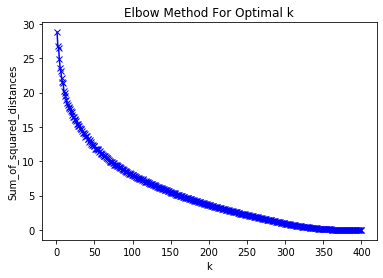

In [145]:
import matplotlib.pyplot as plt
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [146]:
from sklearn.cluster import KMeans

# set number of clusters
#kclusters = KCLUSTERS
kclusters = 50

IN_grouped_clustering = IN_univ_venues_grouped.drop('School', 1)

# run k-means clustering
#need to define n_init=10, max_iter = 300
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(IN_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([14,  5,  3, 14, 16, 16,  3, 12,  9,  9])

In [147]:
IN_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [148]:
pd.options.display.max_rows = 1000
IN_venues_sorted

,Cluster Labels,School,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,14,Adler University,Theater,Hotel,Coffee Shop,Salad Place,Middle Eastern Restaurant,Gastropub,Sandwich Place,Mediterranean Restaurant,Outdoor Sculpture,Trail
1,5,Alexandria School of Scientific Therapeutics,Post Office,Pizza Place,Golf Course,Discount Store,Grocery Store,Diner,Bank,Pharmacy,Bar,Music Store
2,3,Ambria College of Nursing,Furniture / Home Store,Clothing Store,Gym,Food Court,Department Store,Food,Stadium,Big Box Store,Chinese Restaurant,Office
3,14,American Academy of Art,Theater,Park,Middle Eastern Restaurant,Fountain,Music Venue,Arts & Crafts Store,Trail,Outdoor Sculpture,Gastropub,Art Museum
4,16,American College of Education,Mexican Restaurant,Steakhouse,Bar,Pizza Place,Library,Scenic Lookout,Frozen Yogurt Shop,Sandwich Place,Seafood Restaurant,Southern / Soul Food Restaurant
5,16,American Islamic College,Coffee Shop,Pizza Place,Gym,Park,Italian Restaurant,Mexican Restaurant,Hot Dog Joint,Non-Profit,Shipping Store,Tennis Court
6,3,Anabaptist Mennonite Biblical Seminary,Sandwich Place,Convenience Store,Pharmacy,Burger Joint,Big Box Store,Golf Course,Mexican Restaurant,Outlet Store,Supermarket,Pizza Place
7,12,Ancilla College,Sculpture Garden,Zoo,Dog Run,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space
8,9,Anderson University,Café,Fast Food Restaurant,Mexican Restaurant,American Restaurant,Pharmacy,Video Store,Bakery,Restaurant,Bus Station,Taco Place
9,9,Augustana College,Fast Food Restaurant,Mexican Restaurant,Pizza Place,Brewery,Grocery Store,Pharmacy,Café,Coffee Shop,Bar,Garden


In [149]:
IN_merged = df_midwest

IN_merged = IN_merged.join(IN_venues_sorted.set_index('School'), on='NAME')

In [150]:
pd.options.display.max_rows = 1000
IN_merged = IN_merged.dropna()
IN_merged.reset_index(drop=True)

,NAME,CITY,STATE,LAT,LON,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Flashpoint Chicago A Campus of Columbia Colleg...,Chicago,IL,41.882848,-87.631154,14.0,Hotel,Theater,Salad Place,Middle Eastern Restaurant,Coffee Shop,Vegetarian / Vegan Restaurant,Bar,Gastropub,Sandwich Place,Opera House
1,Adler University,Chicago,IL,41.882414,-87.629156,14.0,Theater,Hotel,Coffee Shop,Salad Place,Middle Eastern Restaurant,Gastropub,Sandwich Place,Mediterranean Restaurant,Outdoor Sculpture,Trail
2,American Academy of Art,Chicago,IL,41.877420,-87.624788,14.0,Theater,Park,Middle Eastern Restaurant,Fountain,Music Venue,Arts & Crafts Store,Trail,Outdoor Sculpture,Gastropub,Art Museum
3,American Islamic College,Chicago,IL,41.954969,-87.646898,16.0,Coffee Shop,Pizza Place,Gym,Park,Italian Restaurant,Mexican Restaurant,Hot Dog Joint,Non-Profit,Shipping Store,Tennis Court
4,School of the Art Institute of Chicago,Chicago,IL,41.881050,-87.625758,14.0,Theater,Middle Eastern Restaurant,Gastropub,Park,Salad Place,Hotel,Trail,Sandwich Place,Coffee Shop,Garden
5,Augustana College,Rock Island,IL,41.502365,-90.550570,9.0,Fast Food Restaurant,Mexican Restaurant,Pizza Place,Brewery,Grocery Store,Pharmacy,Café,Coffee Shop,Bar,Garden
6,Aurora University,Aurora,IL,41.753631,-88.349023,5.0,Pizza Place,Bar,Fast Food Restaurant,Gas Station,Grocery Store,Mexican Restaurant,Park,High School,American Restaurant,Golf Course
7,Tricoci University of Beauty Culture-Urbana,Urbana,IL,40.117729,-88.205988,13.0,Bar,Ice Cream Shop,BBQ Joint,American Restaurant,Fast Food Restaurant,Chinese Restaurant,Bank,Vegetarian / Vegan Restaurant,Theater,Sandwich Place
8,Southwestern Illinois College,Belleville,IL,38.516406,-89.924466,9.0,Fast Food Restaurant,Sandwich Place,American Restaurant,Salon / Barbershop,Asian Restaurant,Gym,Light Rail Station,Video Game Store,Hardware Store,Mexican Restaurant
9,Bethany Theological Seminary,Richmond,IN,39.826244,-84.910689,5.0,Pizza Place,Discount Store,Theater,Pharmacy,Fast Food Restaurant,Sandwich Place,Video Store,Chinese Restaurant,Restaurant,Fried Chicken Joint


In [151]:
# create map
import matplotlib.cm as cm
import matplotlib.colors as colors

map_clusters = folium.Map(location=[sb_lat, sb_lon], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(IN_merged['LAT'], IN_merged['LON'], IN_merged['NAME'], IN_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Examine Clusters

In [152]:
IN_merged.loc[IN_merged['Cluster Labels'] == 0, IN_merged.columns[[1] + list(range(5, IN_merged.shape[1]))]]

,CITY,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1144,Edwardsville,0.0,Fast Food Restaurant,Pool,Athletics & Sports,College Quad,Dessert Shop,Weight Loss Center,Coffee Shop,Bowling Alley,Garden,Event Service
1186,Jeffersonville,0.0,Fast Food Restaurant,Discount Store,Pizza Place,Convenience Store,Breakfast Spot,Bank,Thai Restaurant,Sandwich Place,Grocery Store,Big Box Store
1241,Upland,0.0,College Cafeteria,Gym,Concert Hall,Ice Cream Shop,Convenience Store,College Gym,College Basketball Court,Discount Store,Factory,Fabric Shop
1397,Greenfield,0.0,Fast Food Restaurant,Convenience Store,Discount Store,Multiplex,Theater,Gas Station,Flower Shop,Greek Restaurant,Trail,Gym
5476,Jeffersonville,0.0,Fast Food Restaurant,Discount Store,Pizza Place,Steakhouse,Mexican Restaurant,Baseball Field,Bank,Chinese Restaurant,Sandwich Place,Dive Bar


In [153]:
IN_merged.loc[IN_merged['Cluster Labels'] == 1, IN_merged.columns[[1] + list(range(5, IN_merged.shape[1]))]]

,CITY,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1016,Chicago,1.0,Shoe Store,Sandwich Place,Department Store,Mexican Restaurant,Discount Store,Ice Cream Shop,Donut Shop,Kids Store,Automotive Shop,Italian Restaurant
1044,Skokie,1.0,Sandwich Place,Bookstore,Bakery,Grocery Store,Gym / Fitness Center,Tex-Mex Restaurant,Coffee Shop,Sushi Restaurant,Bagel Shop,Restaurant
1047,Chicago,1.0,Sandwich Place,Italian Restaurant,Hot Dog Joint,Park,Greek Restaurant,Café,Food Service,Dance Studio,Coffee Shop,Liquor Store
1134,Mundelein,1.0,Hot Dog Joint,Bakery,Sandwich Place,Chinese Restaurant,Café,Mexican Restaurant,Liquor Store,Salon / Barbershop,Bank,Donut Shop
1148,South Holland,1.0,Sandwich Place,Rental Car Location,Mexican Restaurant,Community College,Bakery,Grocery Store,Park,Church,Donut Shop,Vegetarian / Vegan Restaurant
1153,Chicago,1.0,Chinese Restaurant,Pizza Place,Asian Restaurant,Bakery,Mexican Restaurant,Art Gallery,Seafood Restaurant,Sculpture Garden,Scenic Lookout,Dive Bar
4213,New Albany,1.0,Ice Cream Shop,Supermarket,Cosmetics Shop,Breakfast Spot,Mexican Restaurant,Pizza Place,Coffee Shop,Smoothie Shop,Auto Garage,Grocery Store
4323,Mount Prospect,1.0,Ice Cream Shop,Mexican Restaurant,Bakery,Sandwich Place,Pizza Place,Grocery Store,Farmers Market,Coffee Shop,Frozen Yogurt Shop,Massage Studio
4445,Niles,1.0,Coffee Shop,Mexican Restaurant,Greek Restaurant,Liquor Store,Grocery Store,Falafel Restaurant,Big Box Store,Sandwich Place,Chinese Restaurant,Bakery
5427,Rockford,1.0,Sandwich Place,Pizza Place,Seafood Restaurant,Massage Studio,Supermarket,Dessert Shop,Department Store,Japanese Restaurant,Italian Restaurant,Asian Restaurant


In [154]:
IN_merged.loc[IN_merged['Cluster Labels'] == 2, IN_merged.columns[[1] + list(range(5, IN_merged.shape[1]))]]

,CITY,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1096,Palos Hills,2.0,Food & Drink Shop,Bar,Coffee Shop,Park,Trail,Gym / Fitness Center,Zoo,Eye Doctor,Eastern European Restaurant,Electronics Store
1167,Whiting,2.0,Bar,Pizza Place,Discount Store,Café,Pharmacy,Steakhouse,Sports Bar,Baseball Stadium,Surf Spot,Mexican Restaurant
1177,Franklin,2.0,Pizza Place,Bar,Park,American Restaurant,Coffee Shop,Trail,Toy / Game Store,Gym / Fitness Center,Rock Club,Video Store


In [155]:
IN_merged.loc[IN_merged['Cluster Labels'] == 3, IN_merged.columns[[1] + list(range(5, IN_merged.shape[1]))]]

,CITY,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
992,Moline,3.0,Chinese Restaurant,Rental Car Location,Sandwich Place,Gift Shop,Bank,Automotive Shop,Discount Store,Auto Dealership,Diner,Grocery Store
1002,Hanover Park,3.0,Intersection,Fast Food Restaurant,Flower Shop,Dance Studio,Breakfast Spot,Food & Drink Shop,Smoke Shop,Market,Shop & Service,Chinese Restaurant
1003,Oak Forest,3.0,Pizza Place,Bank,Breakfast Spot,Chinese Restaurant,Pharmacy,Supermarket,Intersection,Salon / Barbershop,Sandwich Place,Gym / Fitness Center
1014,Chicago,3.0,Cosmetics Shop,Women's Store,Fried Chicken Joint,Burger Joint,Intersection,Optical Shop,Shoe Store,Discount Store,Football Stadium,Department Store
1020,River Forest,3.0,Grocery Store,Pizza Place,Historic Site,Fast Food Restaurant,Sushi Restaurant,Park,Bar,Salon / Barbershop,Sandwich Place,Liquor Store
1027,Crystal Lake,3.0,Home Service,Rental Car Location,Spa,Flower Shop,Fast Food Restaurant,Bowling Alley,Skating Rink,Martial Arts Dojo,Donut Shop,Garden Center
1034,Crystal Lake,3.0,Chinese Restaurant,Thrift / Vintage Store,Fried Chicken Joint,Liquor Store,Grocery Store,Jewelry Store,Golf Course,Discount Store,Salon / Barbershop,Art Gallery
1038,University Park,3.0,Food Court,Sculpture Garden,Concert Hall,Lake,Train Station,Gym,Gas Station,Eye Doctor,Dry Cleaner,Eastern European Restaurant
1043,Oswego,3.0,Italian Restaurant,Fast Food Restaurant,Donut Shop,Café,Farmers Market,Gift Shop,Bank,Gastropub,Gas Station,Men's Store
1048,Lisle,3.0,Sandwich Place,Chinese Restaurant,Convenience Store,Park,Korean Restaurant,Golf Course,Liquor Store,Ski Area,Italian Restaurant,Track


In [156]:
IN_merged.loc[IN_merged['Cluster Labels'] == 4, IN_merged.columns[[1] + list(range(5, IN_merged.shape[1]))]]

,CITY,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1131,Dixon,4.0,Business Service,Zoo,Farm,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor
1141,Dixon,4.0,Business Service,Zoo,Farm,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor


In [160]:
IN_merged.loc[IN_merged['Cluster Labels'] == 16, IN_merged.columns[[0] + list(range(1, IN_merged.shape[1]))]]

,NAME,CITY,STATE,LAT,LON,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
985,American Islamic College,Chicago,IL,41.954969,-87.646898,16.0,Coffee Shop,Pizza Place,Gym,Park,Italian Restaurant,Mexican Restaurant,Hot Dog Joint,Non-Profit,Shipping Store,Tennis Court
996,Bradley University,Peoria,IL,40.696896,-89.616786,16.0,Pizza Place,Mexican Restaurant,Coffee Shop,Sandwich Place,Pharmacy,Food Service,Donut Shop,Theater,Bar,Discount Store
997,Paul Mitchell the School-Bradley,Bourbonnais,IL,41.172891,-87.847099,16.0,Pizza Place,Mexican Restaurant,Coffee Shop,Sandwich Place,Pharmacy,Food Service,Donut Shop,Theater,Bar,Discount Store
999,Cannella School of Hair Design-Villa Park,Villa Park,IL,41.904170,-87.994628,16.0,Mexican Restaurant,Coffee Shop,Grocery Store,Discount Store,Donut Shop,Convenience Store,Rental Car Location,Theme Park,Motorcycle Shop,Fast Food Restaurant
1000,Cannella School of Hair Design-Chicago,Chicago,IL,41.731381,-87.551622,16.0,Mexican Restaurant,Sandwich Place,Pharmacy,Donut Shop,Discount Store,Grocery Store,Italian Restaurant,Fish Market,Bank,Seafood Restaurant
1001,Cannella School of Hair Design-Chicago,Chicago,IL,41.815763,-87.701198,16.0,Mexican Restaurant,Sandwich Place,Pharmacy,Donut Shop,Discount Store,Grocery Store,Italian Restaurant,Fish Market,Bank,Seafood Restaurant
1032,Elmhurst College,Elmhurst,IL,41.897164,-87.945369,16.0,Pizza Place,Beer Bar,Burger Joint,Coffee Shop,Italian Restaurant,Ramen Restaurant,Shoe Store,Sandwich Place,New American Restaurant,Taco Place
1042,Hair Professionals Career College,Sycamore,IL,41.962221,-88.718145,16.0,Pizza Place,Sandwich Place,Grocery Store,Mexican Restaurant,Bar,American Restaurant,Gas Station,Breakfast Spot,Chinese Restaurant,Gym
1050,University of Illinois at Urbana-Champaign,Champaign,IL,40.104718,-88.229114,16.0,Coffee Shop,Sushi Restaurant,Mexican Restaurant,Gym,Dessert Shop,Sandwich Place,College Basketball Court,Food Truck,Greek Restaurant,Diner
1051,Illinois Wesleyan University,Bloomington,IL,40.489901,-88.992014,16.0,Bar,Sandwich Place,Flower Shop,Chinese Restaurant,Tapas Restaurant,Student Center,Mexican Restaurant,Farmers Market,Music Venue,Smoke Shop


In [170]:
IN_Summerized = IN_merged.groupby('Cluster Labels').count().sort_values(by='NAME',ascending=False)

In [174]:
IN_Summerized[IN_Summerized['NAME'] > 1]

,NAME,CITY,STATE,LAT,LON,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Cluster Labels,,,,,,,,,,,,,,,
16.0,52,52,52,52,52,52,52,52,52,52,52,52,52,52,52
3.0,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50
5.0,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37
9.0,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36
13.0,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31
15.0,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25
1.0,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21
8.0,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17
14.0,14,14,14,14,14,14,14,14,14,14,14,14,14,14,14
